# Covid-19 Network Citation
## Project of Netribus Group
## Group Members:
### Fatih Enes Usta
### Gülçin Özlem Atalay
### Nazrin Abbaslı

In [1]:
import numpy as np
import pandas as pd 
import os

In [2]:
import json
import networkx as nx
import matplotlib.pyplot as plt
import json

#Import data frame & create data frame from jsons

In [3]:
path = "C:/Users/Fatih/data/cord-19-research"

In [4]:
kaggle_data = pd.read_csv(path+"/metadata.csv")

C:\Users\Fatih\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


### Importing the data

In [5]:
datafiles = []
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        ifile = os.path.join(dirname, filename)
        if ifile.split(".")[-1] == "json":
            datafiles.append(ifile)

##### We will be looking at one example of json file to understand what usefull information we can get from it. Based on these informations we will be doing filter and removing some parts.

In [6]:
datafiles[0]

'C:/Users/Fatih/data/cord-19-research\\biorxiv_medrxiv\\biorxiv_medrxiv\\pdf_json\\0015023cc06b5362d332b3baf348d11567ca2fbb.json'

In [ ]:
with open('C:/Users/Fatih/data/cord-19-research\\biorxiv_medrxiv\\biorxiv_medrxiv\\pdf_json\\013d9d1cba8a54d5d3718c229b812d7cf91b6c89.json') as f:
    example_json = json.load(f)

print(example_json)

## Example of the json

In [ ]:
{'paper_id': '013d9d1cba8a54d5d3718c229b812d7cf91b6c89',
 'metadata': {'title': 'Assessing spread risk of Wuhan novel coronavirus within and beyond China, January-April 2020: a travel network-based modelling study',
  'authors': [{'first': 'Shengjie',
    'middle': [],
    'last': 'Lai',
    'suffix': '',
    'affiliation': {'laboratory': '',
     'institution': 'University of Southampton',
     'location': {'country': 'UK'}},
    'email': ''},
   {'first': 'Isaac',
    'middle': ['I'],
    'last': 'Bogoch',
    'suffix': '',
    'affiliation': {'laboratory': '',
     'institution': 'University of Toronto',
     'location': {'settlement': 'Toronto', 'country': 'Canada'}},
    'email': ''}

#### By looking at the example, we are dealing with dictionaries, we will access key   ''metadata'' and take the value ''title''

## Now we will access the references by going to the 'bib_entries' over there we have a dictionary that contains:
##     ref_id, title, authors, year, venue, for each reference. 
## We will be creating citations by creating a key value pairs in this part

In [ ]:
 {'BIBREF0': {'ref_id': 'b0',
   'title': 'A Novel Coronavirus Genome Identified in a Cluster of Pneumonia Cases -Wuhan',
   'authors': [{'first': 'W', 'middle': [], 'last': 'Tan', 'suffix': ''},
    {'first': 'X', 'middle': [], 'last': 'Zhao', 'suffix': ''},
    {'first': 'X', 'middle': [], 'last': 'Ma', 'suffix': ''},
    {'first': 'W', 'middle': [], 'last': 'Wang', 'suffix': ''},
    {'first': 'P', 'middle': [], 'last': 'Niu', 'suffix': ''},
    {'first': 'W', 'middle': [], 'last': 'Xu', 'suffix': ''}],
   'year': 2019,
   'venue': 'China CDC Weekly',
   'volume': '2',
   'issn': '4',
   'pages': '61--63',
   'other_ids': {}},
  'BIBREF1': {'ref_id': 'b1',
   'title': 'Clinical features of patients infected with 2019 novel coronavirus in Wuhan',
   'authors': [{'first': 'C', 'middle': [], 'last': 'Huang', 'suffix': ''},
    {'first': 'Y', 'middle': [], 'last': 'Wang', 'suffix': ''},
    {'first': 'X', 'middle': [], 'last': 'Li', 'suffix': ''},
    {'first': 'L', 'middle': [], 'last': 'Ren', 'suffix': ''},
    {'first': 'J', 'middle': [], 'last': 'Zhao', 'suffix': ''},
    {'first': 'Y', 'middle': [], 'last': 'Hu', 'suffix': ''}],
   'year': 2020,
   'venue': 'China. Lancet',
   'volume': '',
   'issn': '',
   'pages': '',
   'other_ids': {'DOI': ['10.1016/S0140-6736(20)30183-5'],
    'PMID': ['31986264']}},

##### 'title': 'A Novel Coronavirus Genome Identified in a Cluster of Pneumonia Cases -Wuhan' accessed this one lowered it and splitted it if a word matches with ('proc.) and if there is we will take the sentences before it.


#### After that if title is in the removed tabs we will break the loop and continue with the next element, however if it does not what we will do is, we will access the titles and make a list of every word and will take the intersection of it with the will_be_filtered and if their intersection is 0 which means they have no element in common, we will create our citations by appending our citation list.

In [7]:
citations = []
will_be_filtered = ['proc.', 'magazine'] 
will_be_removed =["publisher's note", "world health organization", "fields virology", "united states census", "geneva: world health organization"]
for file in datafiles:
    with open(file,'r')as f:
        doc = json.load(f)
    titles = doc['metadata']['title'].lower()
    
    for key,value in doc['bib_entries'].items():
        value['title'] = value['title'].lower().split('proc.')[0]
        if value['title'] in will_be_removed: 
            continue
        number_of_common_elements = []
        value_title = value['title'].lower().split(' ')
        for element in will_be_filtered:
            if element in value_title:
                 number_of_common_elements.append(element)
            if len(number_of_common_elements) == 0 and len(value['title'].lower()) > 0:
                citations.append({"title": titles, "citation": value['title'].lower()})

##### We will use this part to find specific key words.

In [8]:
database = []
for file in datafiles:
    with open(file,'r')as f:
        doc = json.load(f)
    id = doc['paper_id']
    title = doc['metadata']['title']
    
    #We will use this part to look for specific keywords
    database_bib = []
    for key,value in doc['bib_entries'].items():
        reference_id = key
        title = value['title']
        pub_year = value['year']
        venue_place = value['venue']
        try:
            DOI = value['other_ids']['DOI'][0]
        except:
            DOI = 'NA'
        
        database_bib.append({"refid": reference_id,\
                      "ref_title":title,\
                      "year": pub_year,\
                      "venue":venue_place,\
                      "DOI": DOI})
    database.append({"id": id, "bib": database_bib,"title": title})

##### Now we will be creating a dataframe  that we created

In [9]:
citations_df = pd.DataFrame(citations)


### Using Graph X

In [10]:
G = nx.from_pandas_edgelist(citations_df,source='title',target='citation',create_using=nx.DiGraph())
undirected_G = nx.from_pandas_edgelist(citations_df,source='title',target='citation',create_using=nx.Graph())

In [11]:
number_of_nodes = len(list(G.nodes))
print("Number of nodes:", number_of_nodes)

Number of nodes: 1271588


In [12]:
number_of_edges = len(list(G.edges))
print("Number of edges:", number_of_edges)

Number of edges: 2264535


## Now we will look for the paper that has received the most citations.

##### Getting the maximum citation from in degree

In [13]:
max(dict(G.in_degree()).items(), key = lambda x : x[1])

('isolation of a novel coronavirus from a man with pneumonia in saudi arabia',
 1027)

### Centrality Scores

##### In degree

In [14]:
in_degree_centrality = nx.in_degree_centrality(G)

In [19]:
print("In degree Centrality:", in_degree_centrality["isolation of a novel coronavirus from a man with pneumonia in saudi arabia"])

In degree Centrality: 0.0008076521700835256


##### Out degree

In [16]:
out_degree_centrality = nx.out_degree_centrality(G)

In [21]:
print("Out degree Centrality:", max(out_degree_centrality.values()))

Out degree Centrality: 0.12309421219310988


# PageRank is a way of measuring the importance of articles (nodes)

#### PageRank computes a ranking of the nodes in the graph G based on the structure of the incoming links. It was originally designed as an algorithm to rank web pages. 

### Directed representation of the digraph with page rankings

In [17]:
pd.options.display.float_format = '{:.8f}'.format

In [18]:
ranking_direct = (
    pd.DataFrame(nx.pagerank(G.to_directed()).items(), columns=["Title", "Page Ranking"])
    .sort_values(by="Page Ranking", ascending=False))

In [19]:
ranking_direct

,Title,Page Ranking
194,isolation of a novel coronavirus from a man wi...,0.00002223
193,identification of a novel coronavirus in patie...,0.00002161
192,a novel coronavirus associated with severe acu...,0.00002044
3119,coronavirus as a possible cause of severe acut...,0.00001723
157,"early transmission dynamics in wuhan, china, o...",0.00001477
...,...,...
753509,cd8+ t cell immunity to 2009 pandemic and seas...,0.00000077
753586,a rational approach to selective pharmacophore...,0.00000077
244721,syrian hamster as an animal model for the stud...,0.00000077
244701,perspective piece ebola policies that hinder e...,0.00000077


# Getting the most references

In [26]:
# list out keys and values separately 
key_list = list(dict(G.out_degree()).keys()) 
val_list = list(dict(G.out_degree()).values()) 


## Articles with highest reference numbers

In [63]:
print("Maximum out degree name of the title and score:", max(dict(G.out_degree()).items(), key = lambda x : x[1]))

Maximum out degree name of the title and score: ('', 156525)


#### Since the first one does not have a title we also looked for the second and third one

##### First, second, and third values

In [41]:
print("1:",first_highest,"nan",":",list(sorted((dict(G.out_degree())).values()))[-1],"\n2:",second_highest,":",list(sorted((dict(G.out_degree())).values()))[-2],"\n3:",third_highest,":",list(sorted((dict(G.out_degree())).values()))[-3])

1:  nan : 156525 
2: bibliography of the current world literature : 8696 
3: bibliography of the current world literature pharmaceutical biotechnology novel approaches for generating drugs drug design and structural studies receptors and protein kinases cancer genetics and treatment peptides and protein drugs cytokines and hormones : 2482


# Ego Graph

### The first one we are plotting has a value of 156525  references. However, does not have title, so decided to visualize the second one since it has a title.

C:\Users\Fatih\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


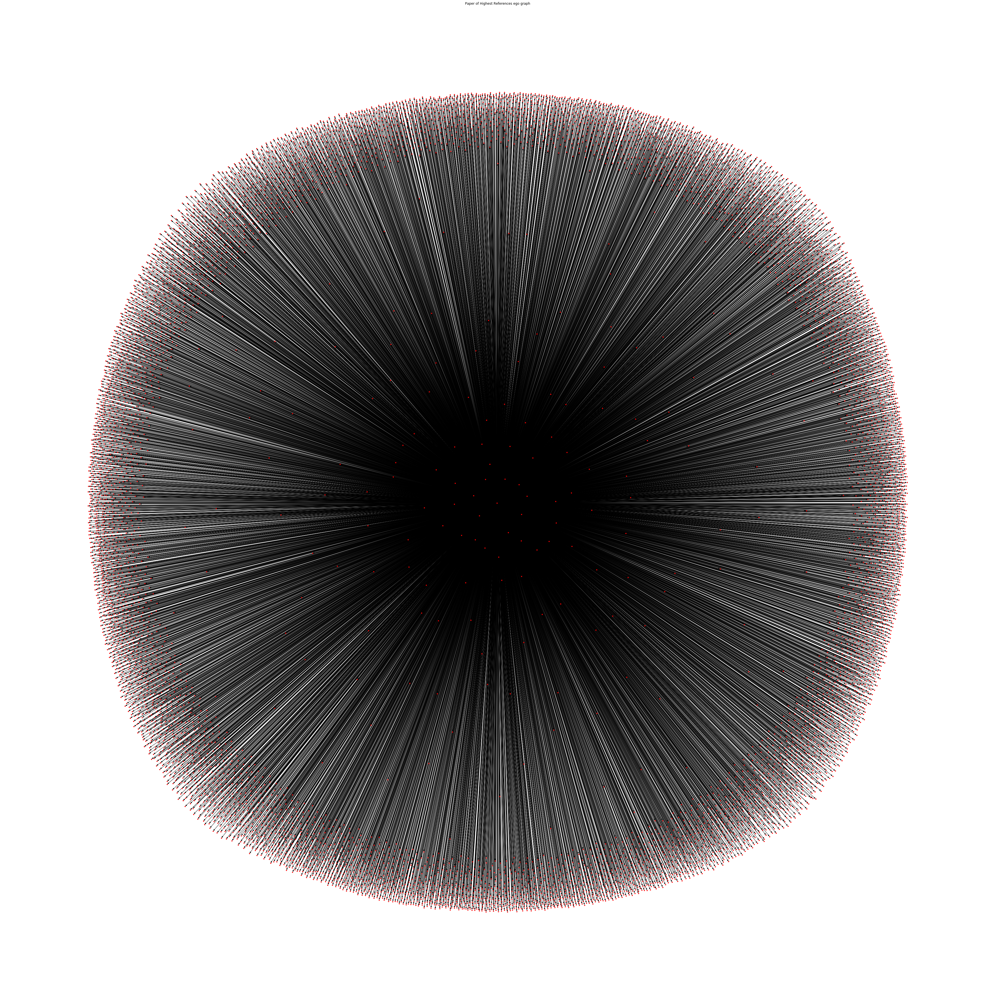

In [97]:
H = nx.ego_graph(G, second_highest, radius=1)
size = 50
plt.figure(figsize = [size,size]) 
pos = nx.spring_layout(H) 
nx.draw(H, with_labels=False, node_size = 10 , node_color = 'red')
plt.title('Paper of Highest References ego graph')
plt.savefig('first_highest.png')

###### Now let's try smaller example

In [57]:
citations[100]

{'title': 'cheer: hierarchical taxonomic classification for viral metagenomic data via deep learning',
 'citation': 'naive bayesian classifier for rapid assignment of rrna sequences into the new bacterial taxonomy'}

In [58]:
one_title = "cheer: hierarchical taxonomic classification for viral metagenomic data via deep learning"

In [59]:
print(f"The paper '{one_title}' \n is cited {G.in_degree[one_title]} times. Its annexe contain {G.out_degree[one_title]} references.")

The paper 'cheer: hierarchical taxonomic classification for viral metagenomic data via deep learning' 
 is cited 0 times. Its annexe contain 34 references.


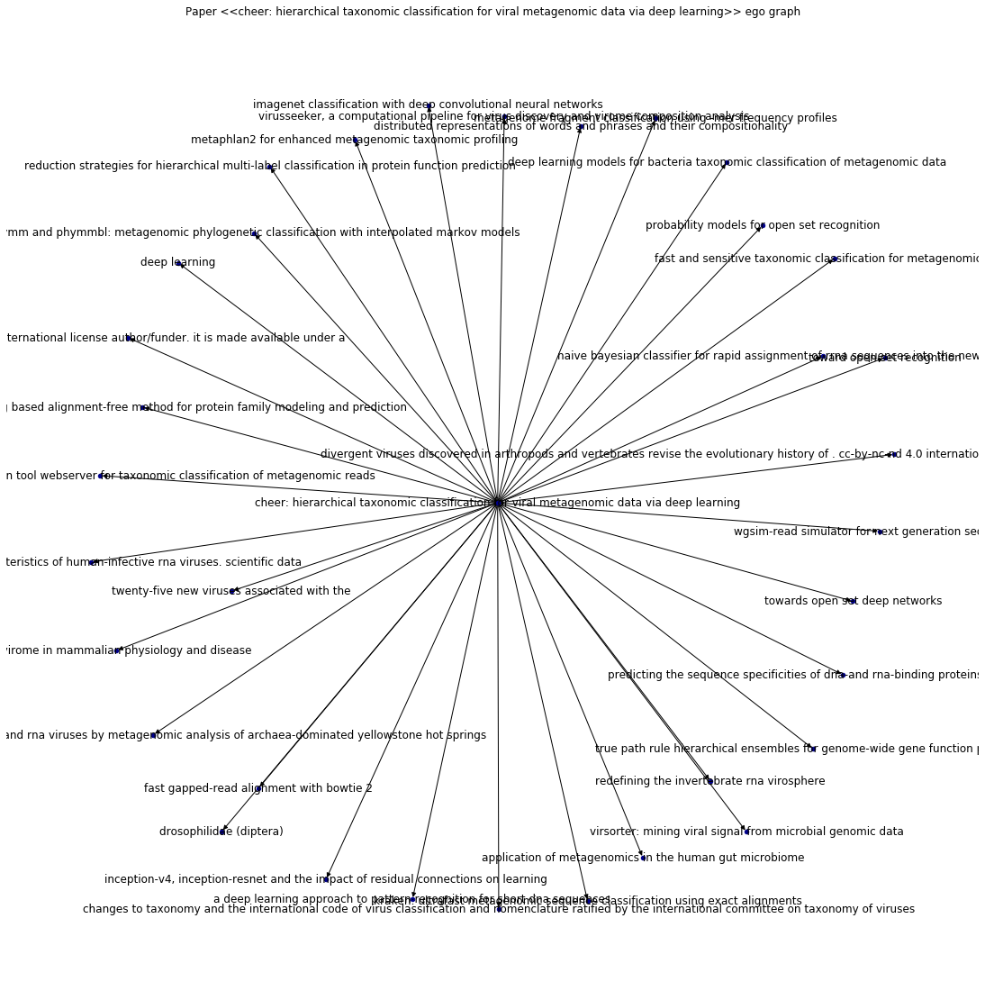

In [60]:
H= nx.ego_graph(G, one_title, radius=1)
size = 15
plt.figure(figsize = [size,size]) 
pos = nx.spring_layout(H) 
nx.draw(H, with_labels=True, node_size = 20 , node_color = 'darkblue')
plt.title(f'Paper <<{one_title}>> ego graph')
plt.savefig('an_example.png')

### Keywords to plot

#### Since our dataset is huge, we will be looking for the first 500 ones.

#### keyword "corona"

In [64]:
#Searching for ones that has 'corona' keyword in it
Gc = nx.Graph()
for item in database[0:500]:
    if item['title'].find('corona'):
        for ref in item['bib']:
            Gc.add_node(item['id'],title = item['title'])
            Gc.add_node(ref['DOI'], title = ref['ref_title'], pub_year = ref['year'], venue_place = ref['venue'])
            Gc.add_edge(item['id'], ref['DOI'], value = ref['refid'])


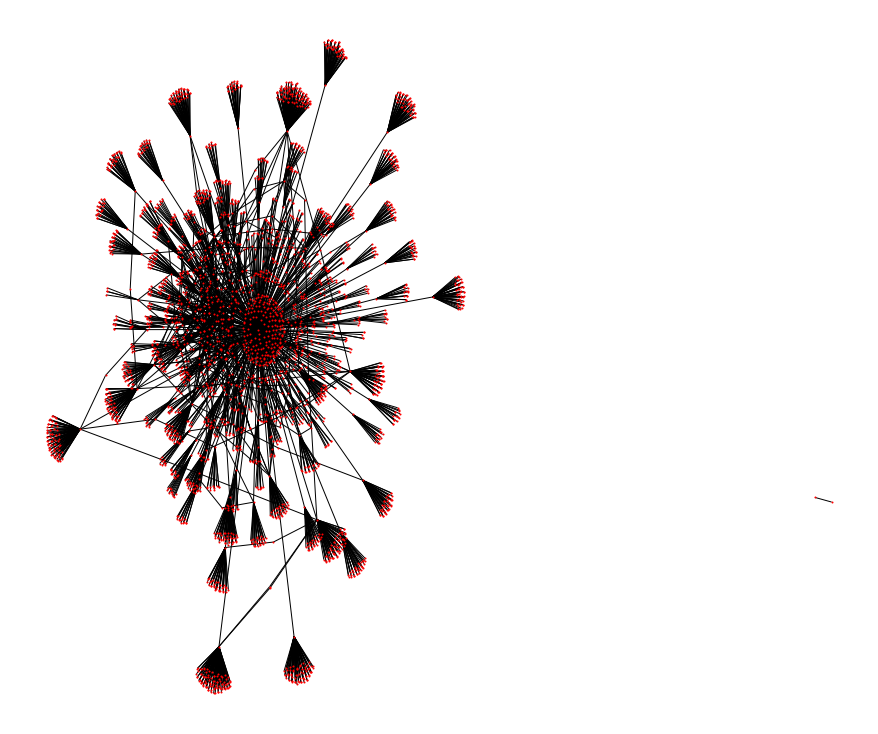

In [65]:
plt.figure(figsize = [12,10]) 
pos2 = nx.spring_layout(Gc) 
nx.draw(Gc, with_labels=False, node_size = 1, node_color = 'red') 
plt.savefig('cite2.png')

### keyword "virus"

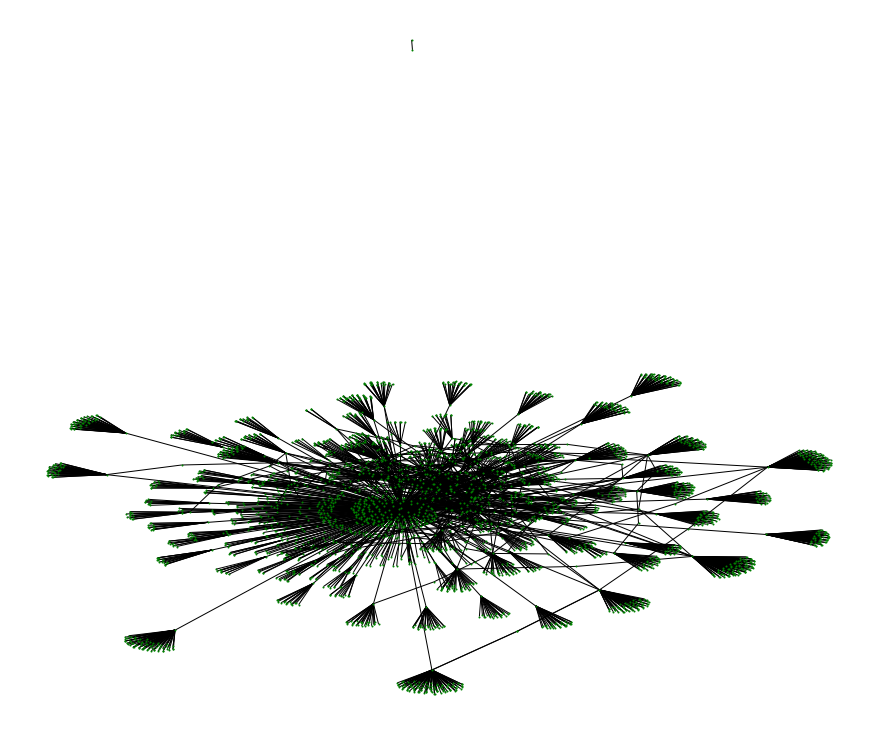

In [66]:
#Searching for ones that has 'virus' keyword in it
Gc = nx.Graph()
for item in database[0:500]:
    if item['title'].find('virus'):
        for ref in item['bib']:
            Gc.add_node(item['id'],title = item['title'])
            Gc.add_node(ref['DOI'], title = ref['ref_title'],  pub_year = ref['year'], venue_place = ref['venue'])
            Gc.add_edge(item['id'], ref['DOI'], value = ref['refid'])
plt.figure(figsize = [12,10]) 
pos2 = nx.spring_layout(Gc) 
nx.draw(Gc, with_labels=False, node_size = 1, node_color = 'green') 
plt.savefig('cite3.png')

### keyword "wuhan"

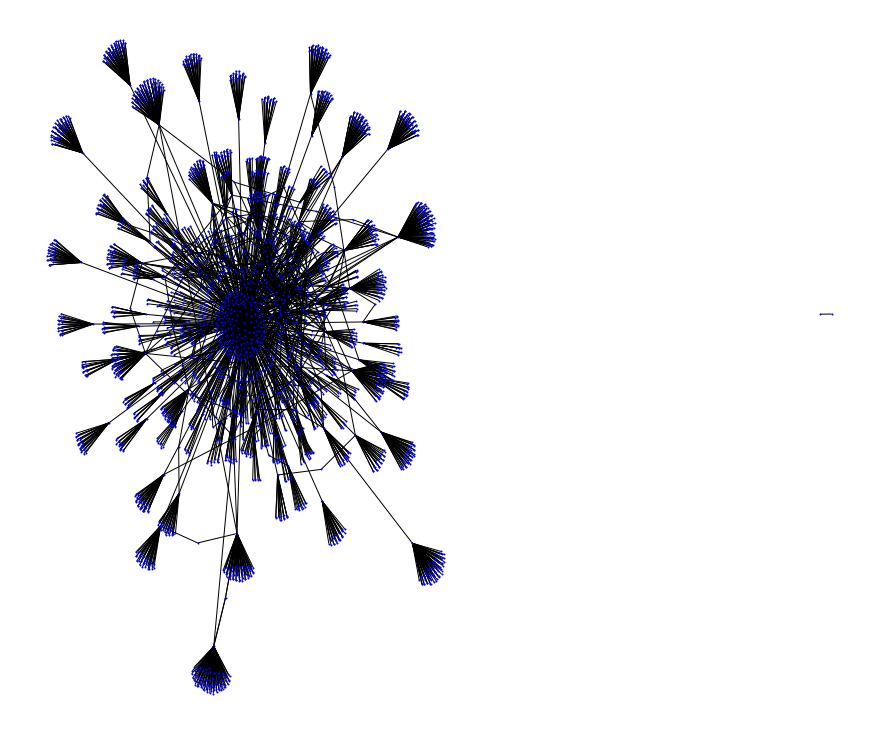

In [67]:
#Searching for ones that has 'wuhan' keyword in it
Gc = nx.Graph()
for item in database[0:500]:
    if item['title'].find('wuhan'):
        for ref in item['bib']:
            Gc.add_node(item['id'],title = item['title'])
            Gc.add_node(ref['DOI'], title = ref['ref_title'],  pub_year = ref['year'], venue_place = ref['venue'])
            Gc.add_edge(item['id'], ref['DOI'], value = ref['refid'])
plt.figure(figsize = [12,10]) 
pos2 = nx.spring_layout(Gc) 
nx.draw(Gc, with_labels=False, node_size = 1, node_color = 'blue') 
plt.savefig('cite4.png')

### keyword "sars"

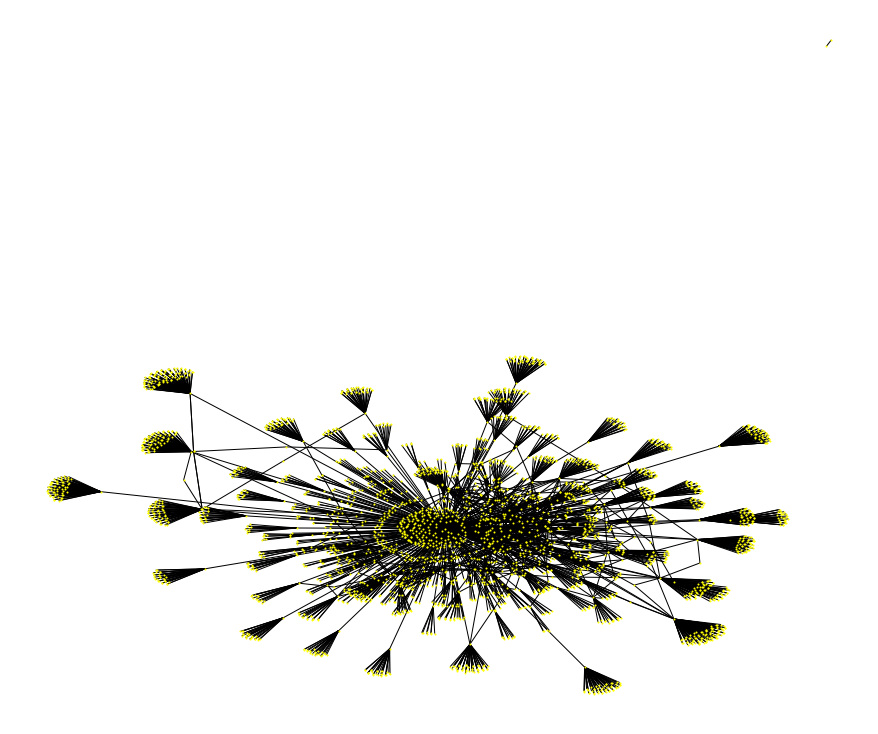

In [68]:
#Searching for ones that has 'sars' keyword in it
Gc = nx.Graph()
for item in database[0:500]:
    if item['title'].find('sars'):
        for ref in item['bib']:
            Gc.add_node(item['id'],title = item['title'])
            Gc.add_node(ref['DOI'], title = ref['ref_title'],  pub_year = ref['year'], venue_place = ref['venue'])
            Gc.add_edge(item['id'], ref['DOI'], value = ref['refid'])
plt.figure(figsize = [12,10]) 
pos2 = nx.spring_layout(Gc) 
nx.draw(Gc, with_labels=False, node_size = 1, node_color = 'yellow') 
plt.savefig('cite5.png')

### keyword "china"

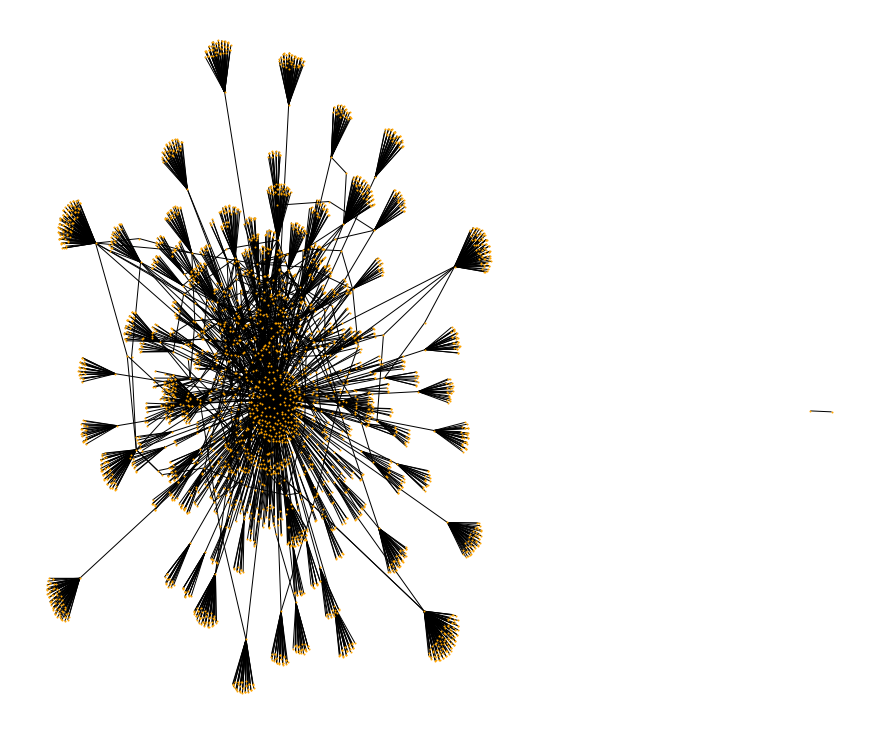

In [69]:
#Searching for ones that has 'china' keyword in it
Gc = nx.Graph()
for item in database[0:500]:
    if item['title'].find('china'):
        for ref in item['bib']:
            Gc.add_node(item['id'],title = item['title'])
            Gc.add_node(ref['DOI'], title = ref['ref_title'],  pub_year = ref['year'], venue_place = ref['venue'])
            Gc.add_edge(item['id'], ref['DOI'], value = ref['refid'])
plt.figure(figsize = [12,10]) 
pos2 = nx.spring_layout(Gc) 
nx.draw(Gc, with_labels=False, node_size = 1, node_color = 'orange') 
plt.savefig('cite6.png')

## Look up for the words that has been mentioned most

In [70]:
from collections import Counter

In [71]:
citations_df['title'] = citations_df['title'].astype(str)

In [83]:
from collections import Counter
words = Counter("".join(citations_df["title"]).split()).most_common(10000)

### Removing stop words

In [85]:
import nltk
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

In [86]:
cleaned_words = []
for i in stop_words:
    for s in words:
        if s[0] not in stop_words:
            cleaned_words.append(s[0])

In [87]:
for i in range(11):
    print(cleaned_words[i])

virus
respiratory
viral
,
human
infectious
infection
protein
influenza
coronavirus
disease


### The most used words are:
 'virus',
 'respiratory',
 'viral',
 'human',
 'infectious',
 'infection',
 'protein',
 'influenza',
 'coronavirus',
 'disease',


### This time let's look for these words and see their network

#### Searching for ones that has 'virus' keyword in it

C:\Users\Fatih\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


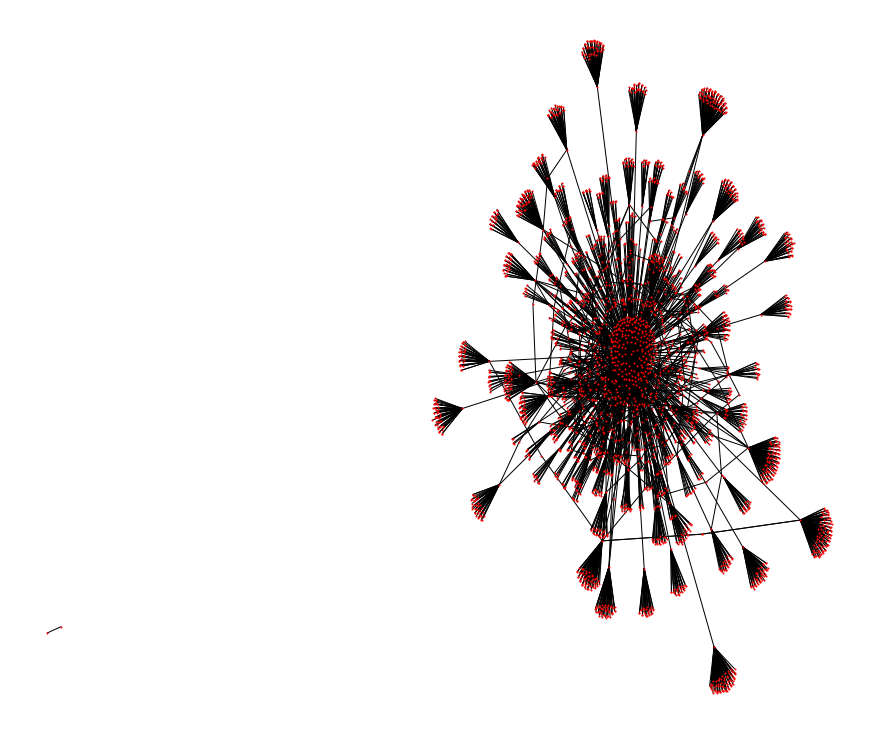

In [76]:
Gc = nx.Graph()
for item in database[0:500]:
    if item['title'].find('virus'):
        for ref in item['bib']:
            Gc.add_node(item['id'],title = item['title'])
            Gc.add_node(ref['DOI'], title = ref['ref_title'],  pub_year = ref['year'], venue_place = ref['venue'])
            Gc.add_edge(item['id'], ref['DOI'], value = ref['refid'])
plt.figure(figsize = [12,10]) 
pos2 = nx.spring_layout(Gc) 
nx.draw(Gc, with_labels=False, node_size = 1, node_color = 'red') 
plt.savefig('virus.png')

#### Searching for ones that has 'infectious' keyword in it


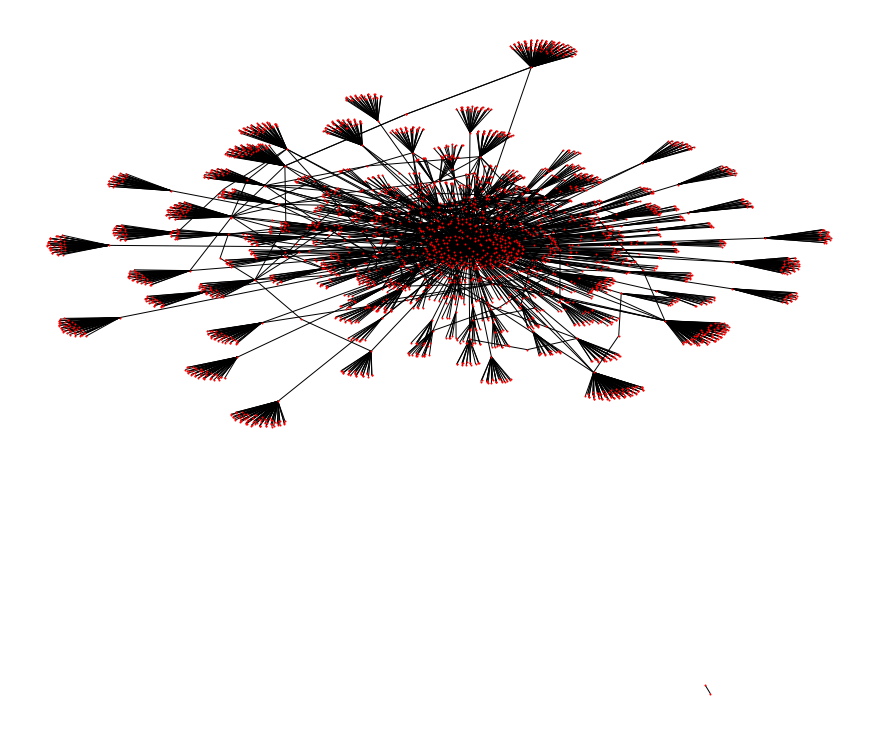

In [77]:
Gc = nx.Graph()
for item in database[0:500]:
    if item['title'].find('infectious'):
        for ref in item['bib']:
            Gc.add_node(item['id'],title = item['title'])
            Gc.add_node(ref['DOI'], title = ref['ref_title'],  pub_year = ref['year'], venue_place = ref['venue'])
            Gc.add_edge(item['id'], ref['DOI'], value = ref['refid'])
plt.figure(figsize = [12,10]) 
pos2 = nx.spring_layout(Gc) 
nx.draw(Gc, with_labels=False, node_size = 1, node_color = 'red') 
plt.savefig('infectious.png')

#### Searching for ones that has 'disease' keyword in it


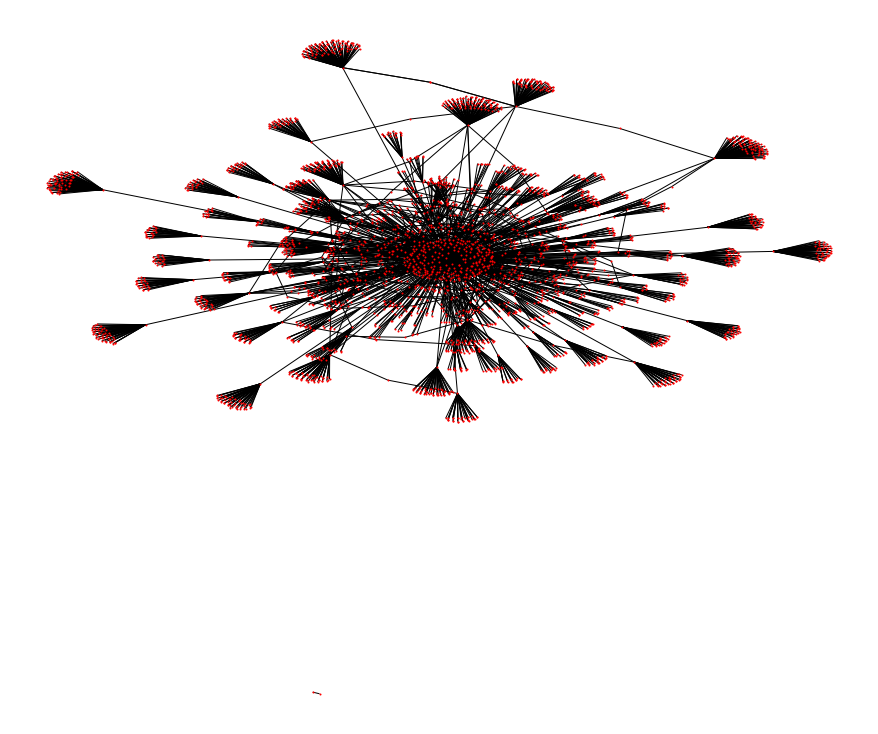

In [78]:
Gc = nx.Graph()
for item in database[0:500]:
    if item['title'].find('disease'):
        for ref in item['bib']:
            Gc.add_node(item['id'],title = item['title'])
            Gc.add_node(ref['DOI'], title = ref['ref_title'],  pub_year = ref['year'], venue_place = ref['venue'])
            Gc.add_edge(item['id'], ref['DOI'], value = ref['refid'])
plt.figure(figsize = [12,10]) 
pos2 = nx.spring_layout(Gc) 
nx.draw(Gc, with_labels=False, node_size = 1, node_color = 'red') 
plt.savefig('disease.png')

# Comparison of "corona", "disease" and "infectious", let's look at how similiar their network look like

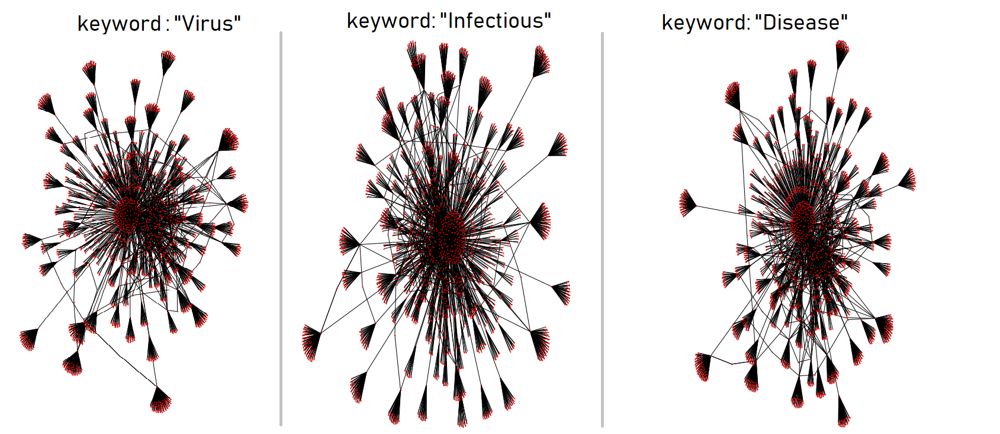

In [79]:
from IPython.display import Image
Image(filename='comparison.png')

## Finding sub communities

#### The length of Undirected Graph

In [88]:
print(len(undirected_G))

1271588


#### We have about 940 sub communities

In [89]:
print(len(list(undirected_G.subgraph(c) for c in nx.connected_components(undirected_G))))

940


In [95]:
connected_components = [len(c) for c in nx.connected_components(undirected_G) if len(c) > 10]

In [96]:
len(connected_components)

352

In [92]:
# There is one giant component of size ~1,258,569
# We have 8 connected components with the size of 118, 111, 267, 310, 102, 140, 166, 141
# And the rest of them is numberwise about (343) [this is calculated by looking components size below 100]

[len(c) for c in nx.connected_components(undirected_G) if len(c) > 10]

[1258569,
 35,
 35,
 30,
 11,
 40,
 15,
 12,
 118,
 18,
 23,
 15,
 67,
 39,
 111,
 25,
 12,
 15,
 20,
 267,
 14,
 28,
 11,
 18,
 26,
 18,
 14,
 24,
 55,
 12,
 22,
 20,
 14,
 24,
 36,
 12,
 21,
 14,
 11,
 16,
 15,
 18,
 37,
 24,
 53,
 61,
 44,
 11,
 30,
 39,
 24,
 27,
 12,
 56,
 12,
 49,
 13,
 34,
 23,
 19,
 310,
 76,
 20,
 12,
 42,
 28,
 15,
 40,
 12,
 18,
 34,
 16,
 48,
 17,
 13,
 102,
 20,
 23,
 28,
 12,
 18,
 40,
 24,
 28,
 11,
 13,
 19,
 11,
 11,
 15,
 18,
 27,
 15,
 77,
 22,
 26,
 26,
 12,
 13,
 16,
 16,
 16,
 46,
 17,
 23,
 33,
 32,
 64,
 23,
 14,
 14,
 34,
 31,
 52,
 19,
 28,
 13,
 82,
 71,
 11,
 13,
 26,
 21,
 12,
 21,
 21,
 14,
 12,
 25,
 15,
 18,
 14,
 14,
 15,
 14,
 41,
 12,
 20,
 42,
 15,
 13,
 32,
 23,
 39,
 140,
 12,
 46,
 17,
 33,
 12,
 30,
 23,
 104,
 64,
 45,
 79,
 13,
 24,
 22,
 29,
 33,
 12,
 27,
 20,
 20,
 24,
 14,
 14,
 27,
 21,
 12,
 54,
 14,
 35,
 12,
 30,
 36,
 14,
 11,
 13,
 48,
 16,
 53,
 56,
 21,
 17,
 21,
 12,
 64,
 46,
 27,
 14,
 19,
 14,
 11,
 31,
 25,
 19

## So we can say that our network is almost constructed by one giant component.